In [4]:
!chmod 0400 ../root/.ssh/id_rsa

In [5]:
!git clone git@github.com:thriftypenguin/litter-imagery-brand-recognition.git
%cd litter-imagery-brand-recognition

Cloning into 'litter-imagery-brand-recognition'...
remote: Enumerating objects: 221, done.
remote: Counting objects: 100% (24/24), done.
remote: Compressing objects: 100% (21/21), done.
remote: Total 221 (delta 8), reused 16 (delta 3), pack-reused 197
Receiving objects: 100% (221/221), 66.23 MiB | 21.43 MiB/s, done.
Resolving deltas: 100% (106/106), done.
/content/litter-imagery-brand-recognition


In [6]:
!git clone https://huggingface.co/spaces/nathanjc/Logo_detection_YoloV7
!pip install -r Logo_detection_YoloV7/requirements.txt

Cloning into 'Logo_detection_YoloV7'...
remote: Enumerating objects: 95, done.
remote: Total 95 (delta 0), reused 0 (delta 0), pack-reused 95 (from 1)
Unpacking objects: 100% (95/95), 15.20 KiB | 389.00 KiB/s, done.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.3/12.3 MB 52.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 48.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 92.0/92.0 kB 12.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 318.1/318.1 kB 25.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.6/75.6 kB 6.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 145.0/145.0 kB 13.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.8/8.8 MB 65.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.4/62.4 kB 8.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.9/129.9 kB 16.7 MB/s eta 0:00:00
  Using cach

It will ask to restart the kernel at this time. So reset the directory with `cd` here

In [1]:
%cd litter-imagery-brand-recognition
!git clone https://github.com/WongKinYiu/yolov7.git
!pip install -r yolov7/requirements.txt

/content/litter-imagery-brand-recognition
Cloning into 'yolov7'...
remote: Enumerating objects: 1197, done.
remote: Total 1197 (delta 0), reused 0 (delta 0), pack-reused 1197
Receiving objects: 100% (1197/1197), 74.23 MiB | 9.73 MiB/s, done.
Resolving deltas: 100% (519/519), done.
Updating files: 100% (108/108), done.


In [93]:
import os
import sys
import argparse
import time
from pathlib import Path
import pandas as pd

import gradio as gr
import cv2
from PIL import Image
import torch
import torch.backends.cudnn as cudnn
from numpy import random
import numpy as np
from google.colab.patches import cv2_imshow
from torchvision.transforms.functional import *
from matplotlib import cm

#os.system("pip install yolov7-package==0.0.12")

def detect(opt, save_img=False):
#     from models.experimental import attempt_load
#     from utils.datasets import LoadStreams, LoadImages
#     from utils.general import check_img_size, check_requirements, check_imshow, non_max_suppression, apply_classifier, \
#         scale_coords, xyxy2xywh, strip_optimizer, set_logging, increment_path
    from yolov7.utils.plots import plot_one_box
#     from utils.torch_utils import select_device, load_classifier, time_synchronized, TracedModel

    from yolov7_package import Yolov7Detector
    from yolov7_package.models.experimental import attempt_load
    from yolov7_package.utils.general import check_img_size, check_requirements, check_imshow, non_max_suppression, apply_classifier, \
        scale_coords, xyxy2xywh, strip_optimizer, set_logging, increment_path
    from yolov7_package.utils.torch_utils import select_device, load_classifier, time_synchronized, TracedModel
    from yolov7_package.utils.datasets import LoadStreams, LoadImages

    bbox = {}
    source, weights, view_img, save_txt, imgsz, trace = opt.source, opt.weights, opt.view_img, opt.save_txt, opt.img_size, not opt.no_trace
    save_img = not opt.nosave and not source.endswith('.txt')  # save inference images
    webcam = source.isnumeric() or source.endswith('.txt') or source.lower().startswith(
        ('rtsp://', 'rtmp://', 'http://', 'https://'))

    # Directories
    save_dir = Path(increment_path(Path(opt.project) / opt.name, exist_ok=opt.exist_ok))  # increment run
    (save_dir / 'labels' if save_txt else save_dir).mkdir(parents=True, exist_ok=True)  # make dir

    # Initialize
    set_logging()
    device = select_device(opt.device)
    half = device.type != 'cpu'  # half precision only supported on CUDA

    # Load model
    det = Yolov7Detector(weights=weights, traced=False)
    model = attempt_load(weights, map_location=device)  # load FP32 model
    stride = int(model.stride.max())  # model stride
    imgsz = check_img_size(imgsz, s=stride)  # check img_size

    if trace:
        model = TracedModel(model, device, opt.img_size)

    if half:
        model.half()  # to FP16

    # Second-stage classifier
    classify = False
    if classify:
        modelc = load_classifier(name='resnet101', n=2)  # initialize
        modelc.load_state_dict(torch.load('weights/resnet101.pt', map_location=device)['model']).to(device).eval()

    # Set Dataloader
    vid_path, vid_writer = None, None
    if webcam:
        view_img = check_imshow()
        cudnn.benchmark = True  # set True to speed up constant image size inference
        dataset = LoadStreams(source, img_size=imgsz, stride=stride)
    else:
        dataset = LoadImages(source, img_size=imgsz, stride=stride)

    # Get names and colors
    names = model.module.names if hasattr(model, 'module') else model.names
    colors = [[random.randint(0, 255) for _ in range(3)] for _ in names]

    # Run inference
    if device.type != 'cpu':
        model(torch.zeros(1, 3, imgsz, imgsz).to(device).type_as(next(model.parameters())))  # run once
    old_img_w = old_img_h = imgsz
    old_img_b = 1

    t0 = time.time()
    for path, img, im0s, vid_cap in dataset:
        img = torch.from_numpy(img).to(device)
        img = img.half() if half else img.float()  # uint8 to fp16/32
        img /= 255.0  # 0 - 255 to 0.0 - 1.0
        if img.ndimension() == 3:
            img = img.unsqueeze(0)

        # Warmup
        if device.type != 'cpu' and (old_img_b != img.shape[0] or old_img_h != img.shape[2] or old_img_w != img.shape[3]):
            old_img_b = img.shape[0]
            old_img_h = img.shape[2]
            old_img_w = img.shape[3]
            for i in range(3):
                model(img, augment=opt.augment)[0]

        # Inference
        t1 = time_synchronized()
        with torch.no_grad():   # Calculating gradients would cause a GPU memory leak
            pred = model(img, augment=opt.augment)[0]
        t2 = time_synchronized()

        # Apply NMS
        pred = non_max_suppression(pred, opt.conf_thres, opt.iou_thres, classes=opt.classes, agnostic=opt.agnostic_nms)
        t3 = time_synchronized()

        # Apply Classifier
        if classify:
            pred = apply_classifier(pred, modelc, img, im0s)

        # Process detections
        for i, det in enumerate(pred):  # detections per image
            if webcam:  # batch_size >= 1
                p, s, im0, frame = path[i], '%g: ' % i, im0s[i].copy(), dataset.count
            else:
                p, s, im0, frame = path, '', im0s, getattr(dataset, 'frame', 0)

            p = Path(p)  # to Path
            save_path = str(save_dir / p.name)  # img.jpg
            txt_path = str(save_dir / 'labels' / p.stem) + ('' if dataset.mode == 'image' else f'_{frame}')  # img.txt
            gn = torch.tensor(im0.shape)[[1, 0, 1, 0]]  # normalization gain whwh
            if len(det):
                # Rescale boxes from img_size to im0 size
                det[:, :4] = scale_coords(img.shape[2:], det[:, :4], im0.shape).round()
#                 print(f"BOXES ---->>>> {det[:, :4]}")
                bbox[f"{txt_path.split('/')[4]}"]=(det[:, :4]).numpy()

               # Print results
                for c in det[:, -1].unique():
                    n = (det[:, -1] == c).sum()  # detections per class
                    s += f"{n} {names[int(c)]}{'s' * (n > 1)}, "  # add to string

                # Write results
                i = 0
                for *xyxy, conf, cls in reversed(det):

                    if save_txt:  # Write to file
                        xywh = (xyxy2xywh(torch.tensor(xyxy).view(1, 4)) / gn).view(-1).tolist()  # normalized xywh
                        line = (cls, *xywh, conf) if opt.save_conf else (cls, *xywh)  # label format
                        with open(txt_path + '.txt', 'a') as f:
                            f.write(('%g ' * len(line)).rstrip() % line + '\n')

                    if save_img or view_img:  # Add bbox to image
                        label = f'{names[int(cls)]} {conf:.2f}'

                        xyxy = [int(coord.item()) for coord in xyxy]

                        # Ensure im0 is in the correct format for PIL
                        if isinstance(im0, torch.Tensor):
                            im0 = im0.numpy()
                        im0 = np.uint8(im0 * 255) if im0.max() <= 1 else np.uint8(im0)

                        # Crop the image using the bounding box coordinates with OpenCV
                        x1, y1, x2, y2 = xyxy
                        cropped_image_cv = im0[y1:y2, x1:x2]

                        # Display the cropped image
                        #cv2_imshow(cropped_image_cv)

                        save_path_indiv_img = str(save_dir)+"/"+'img'+str(i)+".jpeg"
                        #print("label", label, save_path_indiv_img)
                        cv2.imwrite(save_path_indiv_img, cropped_image_cv)


                        plot_one_box(xyxy, im0, label=label, color=colors[int(cls)], line_thickness=1)

                        i += 1

            # Print time (inference + NMS)
            print(f'{s}Done. ({(1E3 * (t2 - t1)):.1f}ms) Inference, ({(1E3 * (t3 - t2)):.1f}ms) NMS')

            # Stream results
            # if view_img:
            #     cv2.imshow(str(p), im0)
            #     cv2.waitKey(1)  # 1 millisecond

            # Save results (image with detections)
            if save_img:
                if dataset.mode == 'image':

                    # Image.fromarray(im0).show()
                    #cv2.imwrite(save_path, im0)
                    print(f" The image with the result is saved in: {save_path}")
                # else:  # 'video' or 'stream'
                #     if vid_path != save_path:  # new video
                #         vid_path = save_path
                #         if isinstance(vid_writer, cv2.VideoWriter):
                #             vid_writer.release()  # release previous video writer
                #         if vid_cap:  # video
                #             fps = vid_cap.get(cv2.CAP_PROP_FPS)
                #             w = int(vid_cap.get(cv2.CAP_PROP_FRAME_WIDTH))
                #             h = int(vid_cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
                #         else:  # stream
                #             fps, w, h = 30, im0.shape[1], im0.shape[0]
                #             save_path += '.mp4'
                #         vid_writer = cv2.VideoWriter(save_path, cv2.VideoWriter_fourcc(*'mp4v'), fps, (w, h))
                #     vid_writer.write(im0)

    if save_txt or save_img:
        s = f"\n{len(list(save_dir.glob('labels/*.txt')))} labels saved to {save_dir / 'labels'}" if save_txt else ''
        #print(f"Results saved to {save_dir}{s}")

    print(f'Done. ({time.time() - t0:.3f}s)')
    return bbox,save_path


class options:
    def __init__(self, weights, source, img_size=640, conf_thres=0.1, iou_thres=0.45, device='',
                 view_img=False, save_txt=False, save_conf=False, nosave=False, classes=None,
                 agnostic_nms=False, augment=False, update=False, project='runs/detect', name='exp',
                 exist_ok=False, no_trace=False):
        self.weights=weights
        self.source=source
        self.img_size=img_size
        self.conf_thres=conf_thres
        self.iou_thres=iou_thres
        self.device=device
        self.view_img=view_img
        self.save_txt=save_txt
        self.save_conf=save_conf
        self.nosave=nosave
        self.classes=classes
        self.agnostic_nms=agnostic_nms
        self.augment=augment
        self.update=update
        self.project=project
        self.name=name
        self.exist_ok=exist_ok
        self.no_trace=no_trace


def get_output(input_image, source):
    ### Numpy -> PIL
    input_image = Image.fromarray(np.array(input_image).astype(np.uint8)).convert('RGB')
    #input_image.save(f"input/image.jpg")
    print(source)#source = f"input/"
    opt = options(weights='logo_detection.pt',source=source)
    bbox = None
    with torch.no_grad():
        bbox,output_path = detect(opt)
    if os.path.exists(output_path):
        return Image.open(output_path)
    else:
        return input_image


run.py is a batch script to edit files from yolov7.
When I did pip install yolov7, there was no yolov7/utils. For example, running the following command: !ls /usr/local/lib/python3.10/dist-packages/yolov7/ did not produce the expected directories. I think there was something wrong with the pip install. The commands I used the yielded wrong outputs are as follows. Run run.py to edit the files to be able to run the code

* !pip install yolov7

* !ls /usr/local/lib/python3.10/dist-packages/yolov7/

In [5]:
!python preprocessing/run.py

Running preprocessing/rewrite_experimental.py...
preprocessing/rewrite_experimental.py ran successfully.
Running preprocessing/rewrite_yolov7_utils_general.py...
preprocessing/rewrite_yolov7_utils_general.py ran successfully.
Running preprocessing/rewrite_yolov7_utils_plots.py...
preprocessing/rewrite_yolov7_utils_plots.py ran successfully.


Fusing layers... 
IDetect.fuse
Fusing layers... 
IDetect.fuse
 Convert model to Traced-model... 
 traced_script_module saved! 
 model is traced! 

0
1
2
3
4
5
6
7
8 logos, Done. (1797.5ms) Inference, (0.8ms) NMS
 The image with the result is saved in: runs/detect/exp2/image.jpg
0
1
2
3
4
5
6
7
8 logos, Done. (2115.4ms) Inference, (1.1ms) NMS
 The image with the result is saved in: runs/detect/exp2/litter1.jpeg
Done. (4.292s)


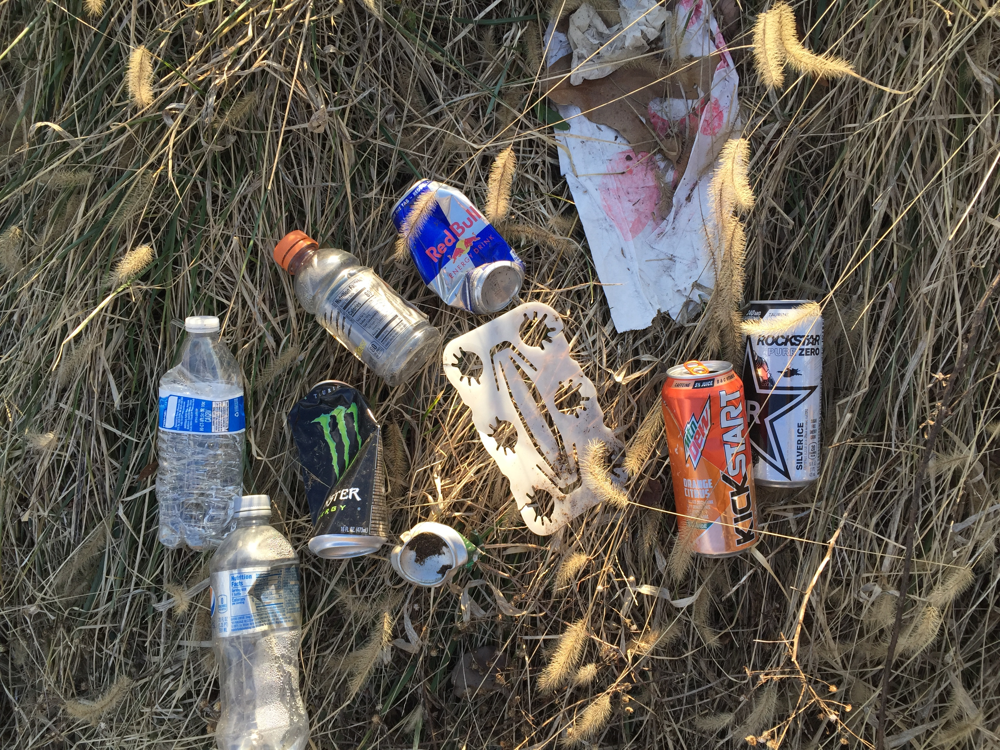

In [59]:
im = Image.open('input/litter1.jpeg')
get_output(im)


In [110]:
#from os import listdir
#from os.path import isfile, join

brands = ['gatorade', 'polandspring']
for eachbrand in brands:
  pth = 'input/'+eachbrand
  #images = (os.listdir(pth))
  images = [img for img in os.listdir(pth) if img.lower().endswith(('.jpeg', '.jpg'))]
  print(images)
  for each_img in images:
    source = (pth+"/"+each_img)
    print("SOURCE", source)
    im = Image.open(pth+"/"+each_img)

    get_output(im, source)




['y2jK1RGFvwNxzrodB57EhgEUt3cAk6cI5dCI5uQF.jpeg', 'UzTbfVMkTHjabspVjVTaUCXz2Z0hA9eWm9iEoniq.jpg', 'nOeMMbjEF2YFJIEBk8p37Qq92nDVO62DJYgc12yg.jpeg', 'bpP4epOojFVLPdRxoJmYxBL2NBnny7EohJZkyoBV.jpeg', 'LEjhLsv403PxE0Ve7U1NhSniYZxZMeFdRJyejoze.jpeg']
SOURCE input/gatorade/y2jK1RGFvwNxzrodB57EhgEUt3cAk6cI5dCI5uQF.jpeg
input/gatorade/y2jK1RGFvwNxzrodB57EhgEUt3cAk6cI5dCI5uQF.jpeg
Fusing layers... 
IDetect.fuse
Fusing layers... 
IDetect.fuse
 Convert model to Traced-model... 
 traced_script_module saved! 
 model is traced! 

5 logos, Done. (1786.8ms) Inference, (0.9ms) NMS
 The image with the result is saved in: runs/detect/exp/y2jK1RGFvwNxzrodB57EhgEUt3cAk6cI5dCI5uQF.jpeg
Done. (1.925s)
SOURCE input/gatorade/UzTbfVMkTHjabspVjVTaUCXz2Z0hA9eWm9iEoniq.jpg
input/gatorade/UzTbfVMkTHjabspVjVTaUCXz2Z0hA9eWm9iEoniq.jpg
Fusing layers... 
IDetect.fuse
Fusing layers... 
IDetect.fuse
 Convert model to Traced-model... 
 traced_script_module saved! 
 model is traced! 

2 logos, Done. (1609.3ms) Inference, (0

In [104]:
#!rm -r /content/litter-imagery-brand-recognition/runs/detect/exp2

In [111]:
import transformers
import PIL
import torch
from tqdm import tqdm
import os

In [113]:
# do from_pretrained so it is aligned with requirements and expectations of the pre-trained BEiT model.
# Normalizes parameters, resizes
# Use from_pretrained to load a pretrained model or feature extractor. Downloads pre-trained weights


img_processor = transformers.BeitImageProcessor.from_pretrained('microsoft/beit-base-patch16-224')
model = transformers.BeitModel.from_pretrained('microsoft/beit-base-patch16-224')

def load_image(img_path):

    image = PIL.Image.open(img_path)#.convert('RGB')
    return image


def generate_embeddings(image_paths, processor, model):
  '''
  This function will generate BEiT Image Embeddings of the logo dataset.
  Output is (n, 768) where n represents the number of images in the logo dataset.

  image_paths: directory of all images
  processor: image processor in the form of transformers.BeitImageProcessor.from_pretrained()
  model: a model in the form of transformers.BeitModel.from_pretrained()
  '''
  embeddings = []

  for image_path in tqdm(image_paths):#image_path in os.listdir(image_paths):#tqdm(image_paths):

      image = load_image(image_path)

      # Preprocess the image
      inputs = processor(images=image, return_tensors="pt")
      with torch.no_grad():
          outputs = model(**inputs)
          cls_embedding = outputs.last_hidden_state[:, 0, :]  # Extract the [CLS] token embedding
          embeddings.append(cls_embedding)

  return torch.cat(embeddings, dim=0)


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/276 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/69.9k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/350M [00:00<?, ?B/s]

In [134]:
dataset_dir = 'input/Logo_dataset_RAW/'
labels = ("gatorade", "polandspring")
image_paths = [os.path.join(dataset_dir, fname, each_image) for fname in os.listdir(dataset_dir) for each_image in os.listdir(dataset_dir+"/"+fname) if fname.endswith(labels)]
X = generate_embeddings(image_paths, img_processor, model)

X.shape #if fname.endswith(('.png', '.jpg', '.jpeg'))

100%|██████████| 10/10 [00:11<00:00,  1.13s/it]


torch.Size([10, 768])

I passed the image in question through the Logo detection model and got the cutout logos, created Image Embeddings of these cutout images also, calling this vector Y (shape will be (m,768) where m is the number of images/bboxes created by the Logo detection model on that image)

.
Fusing layers... 
IDetect.fuse
Fusing layers... 
IDetect.fuse
 Convert model to Traced-model... 
 traced_script_module saved! 
 model is traced! 

4 logos, Done. (2935.5ms) Inference, (31.0ms) NMS
 The image with the result is saved in: runs/detect/exp10/gatorade.jpeg
1 logo, Done. (2781.4ms) Inference, (1.0ms) NMS
 The image with the result is saved in: runs/detect/exp10/gatorade_example.jpeg
Done. (5.967s)


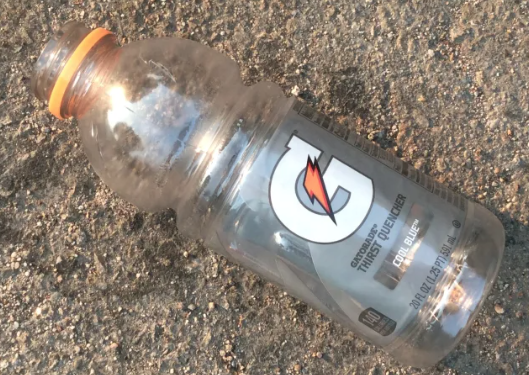

In [141]:
im = Image.open('gatorade.jpeg')
get_output(im, ".")


In [183]:

dataset_dir = 'runs/detect/exp10'
image_paths = [os.path.join(dataset_dir, fname) for fname in os.listdir(dataset_dir) if fname.endswith(('.jpeg', 'jpg'))]
print(image_paths)


Y = generate_embeddings(image_paths, img_processor, model)

Y.shape


['runs/detect/exp10/img3.jpeg']


100%|██████████| 1/1 [00:00<00:00,  1.24it/s]


torch.Size([1, 768])

Then I measured the cosine similarity(you could experiment with other ones too) between all m*n images and saw which one gave the maximum similarity score. (You could apply FAISS indexing here to make it faster although it won’t be 100% accurate, but usually will do the job)

In [187]:
from numpy.linalg import norm
for i, embedding in enumerate(X):

    print(f"Embedding {i+1}")
    cosine = np.dot(Y,embedding)/(norm(Y)*norm(embedding))
    print(cosine)


Embedding 1
[    0.99976]
Embedding 2
[    0.99956]
Embedding 3
[    0.99956]
Embedding 4
[    0.99946]
Embedding 5
[    0.99938]
Embedding 6
[    0.99954]
Embedding 7
[    0.99966]
Embedding 8
[    0.99942]
Embedding 9
[     0.9995]
Embedding 10
[    0.99898]
